# **Notebook 2b**: Mounting Type

<span style="font-size: 1.5rem;">By **Michael Farrugia**</span>

The chosen object detection model for this task is RF-DETR. This notebook is therefore similarly structured to Notebook 2a, with the main difference used and the model prediction task.

## **Environment Setup**

In [9]:
INSTALL_PACKAGES = False

In [10]:
if INSTALL_PACKAGES:
    !pip install -r requirements.txt

In [11]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## **Dataset Validation**

The images used in this notebook are split according to the `.json` files. To use the images in training, the `images` folder must exist - if this folder does not exist, the cell below is used to create the necessary folders according to how the dataset is split.

In [12]:
import json

with open("./dataset/COCO-based_COCO_mounting/annotations/train.json", "r") as f:
    train_annotations = json.load(f)

with open("./dataset/COCO-based_COCO_mounting/annotations/val.json", "r") as f:
    val_annotations = json.load(f)

with open("./dataset/COCO-based_COCO_mounting/annotations/test.json", "r") as f:
    test_annotations = json.load(f)

print(f"Number of images in the train set: {len(train_annotations ['images'])}")
print(f"Number of images in the validation set: {len(val_annotations ['images'])}")
print(f"Number of images in the test set: {len(test_annotations ['images'])}")

Number of images in the train set: 483
Number of images in the validation set: 88
Number of images in the test set: 86


In [13]:
import os
import shutil

if not os.path.exists("./dataset/COCO-based_COCO_mounting/images/"):
    os.makedirs("./dataset/COCO-based_COCO_mounting/images/")

    for dataset, dataset_type in zip([train_annotations, val_annotations, test_annotations], ["train", "val", "test"]):
        os.makedirs(f"./dataset/COCO-based_COCO_mounting/images/{dataset_type}/")
        img_filenames = [img ["file_name"] for img in dataset ["images"]]
        
        for img_filename in img_filenames:
            member_name = img_filename.split("-") [1].split("_") [0]

            img_src_path = f"./{member_name}/images/{img_filename}"
            img_dst_path = f"./dataset/COCO-based_COCO_mounting/images/{dataset_type}/{img_filename}"
            
            shutil.copyfile(img_src_path, img_dst_path)

Furthermore, RF-DETR expects a `_annotations.coco.json` file to exist in each of the `train`, `val` and `test` folders. The cell below creates these files by splitting the original annotations file according to the image splits. Other requirements for RF-DETR compatibility, such as 0-indexed category ids and the presence of the `supercategory` field, are also handled in the cell below.

Finally, rather than using `val`, RF-DETR uses `valid`. The `val` folder is simply copied into the `valid` folder.

In [14]:
fixed_train_annotations = train_annotations.copy()
fixed_val_annotations = val_annotations.copy()
fixed_test_annotations = test_annotations.copy()

for dataset in [fixed_train_annotations, fixed_val_annotations, fixed_test_annotations]:
    min_category_id = min(category ["id"] for category in dataset ["categories"])
    
    if "supercategory" not in dataset ["categories"] [0]:
        for category in dataset ["categories"]:
            category ["supercategory"] = "Maltese Traffic Sign"
            
            if min_category_id == 1:
                category ["id"] -= 1

    if min_category_id == 1:
        for annotation in dataset ["annotations"]:
            annotation ["category_id"] -= 1

In [15]:
# check if _annotations.coco.json files exist in train, val, test folders
for dataset_type in ["train", "val", "test"]:
    annotation_file_path = f"./dataset/COCO-based_COCO_mounting/images/{dataset_type}/_annotations.coco.json"
    
    if not os.path.exists(annotation_file_path):
        print(f"_annotations.coco.json file not found in {dataset_type} folder. Creating the file...")
        if dataset_type == "train":
            with open(annotation_file_path, "w") as f:
                json.dump(fixed_train_annotations, f)
        elif dataset_type == "val":
            with open(annotation_file_path, "w") as f:
                json.dump(fixed_val_annotations, f)
        else: 
            with open(annotation_file_path, "w") as f:
                json.dump(fixed_test_annotations, f)
    else:
        print(f"_annotations.coco.json file already exists in {dataset_type} folder")

_annotations.coco.json file not found in train folder. Creating the file...
_annotations.coco.json file not found in val folder. Creating the file...
_annotations.coco.json file not found in test folder. Creating the file...


In [17]:
# copy val folder to valid folder
if not os.path.exists("./dataset/COCO-based_COCO_mounting/images/valid/"):
    shutil.copytree("./dataset/COCO-based_COCO_mounting/images/val/", "./dataset/COCO-based_COCO_mounting/images/valid/")
    print("Copied val folder to valid folder")

Copied val folder to valid folder


## **Model Setup and Configuration**

In [19]:
from rfdetr import RFDETRBase

rf_detr_model = RFDETRBase()

Loading pretrain weights


## **Model Training**

In [20]:
rf_detr_model.train(
    dataset_dir = "./dataset/COCO-based_COCO_mounting/images/", 
    tensorboard = True, 
    device = device, 
    num_epochs = 10,
    early_stopping = True,
    early_stopping_patience = 3,
    resolution = 448, # required to be a 56-divisible number
    batch_size = 4,
    output_dir = "params/rf-detr-mounting-type",
    lr = 1e-4,
    grad_accum_steps = 4,
)

Reinitializing your detection head with 3 classes.


TensorBoard logging initialized. To monitor logs, use 'tensorboard --logdir C:\Users\micha\Documents\School\University\3rd Year\Advanced Computer Vision for Artificial Intelligence\Assignment\params\rf-detr-mounting-type' and open http://localhost:6006/ in browser.
Not using distributed mode
git:
  sha: N/A, status: clean, branch: N/A

Namespace(num_classes=3, grad_accum_steps=4, print_freq=10, amp=True, lr=0.0001, lr_encoder=0.00015, batch_size=4, weight_decay=0.0001, epochs=100, lr_drop=100, clip_max_norm=0.1, lr_vit_layer_decay=0.8, lr_component_decay=0.7, do_benchmark=False, dropout=0, drop_path=0.0, drop_mode='standard', drop_schedule='constant', cutoff_epoch=0, pretrained_encoder=None, pretrain_weights='rf-detr-base.pth', pretrain_exclude_keys=None, pretrain_keys_modify_to_load=None, pretrained_distiller=None, encoder='dinov2_windowed_small', vit_encoder_num_layers=12, window_block_indexes=None, position_embedding='sine', out_feature_indexes=[2, 5, 8, 11], freeze_encoder=False, l

Epoch: [0]  [ 0/30]  eta: 0:06:23  lr: 0.000100  class_error: 76.92  loss: 9.4551 (9.4551)  loss_ce: 0.9687 (0.9687)  loss_bbox: 0.7820 (0.7820)  loss_giou: 0.5281 (0.5281)  loss_ce_0: 0.9247 (0.9247)  loss_bbox_0: 0.8347 (0.8347)  loss_giou_0: 0.6021 (0.6021)  loss_ce_1: 0.9604 (0.9604)  loss_bbox_1: 0.8080 (0.8080)  loss_giou_1: 0.5836 (0.5836)  loss_ce_enc: 1.0353 (1.0353)  loss_bbox_enc: 0.9044 (0.9044)  loss_giou_enc: 0.5232 (0.5232)  loss_ce_unscaled: 0.9687 (0.9687)  class_error_unscaled: 76.9231 (76.9231)  loss_bbox_unscaled: 0.1564 (0.1564)  loss_giou_unscaled: 0.2640 (0.2640)  cardinality_error_unscaled: 3842.7500 (3842.7500)  loss_ce_0_unscaled: 0.9247 (0.9247)  loss_bbox_0_unscaled: 0.1669 (0.1669)  loss_giou_0_unscaled: 0.3010 (0.3010)  cardinality_error_0_unscaled: 3895.0000 (3895.0000)  loss_ce_1_unscaled: 0.9604 (0.9604)  loss_bbox_1_unscaled: 0.1616 (0.1616)  loss_giou_1_unscaled: 0.2918 (0.2918)  cardinality_error_1_unscaled: 3849.2500 (3849.2500)  loss_ce_enc_unscale

## **Model Evaluation**

![RF-DETR metrics plot](params/rf-detr-mounting-type/metrics_plot.png)

In [22]:
import supervision as sv

ds = sv.DetectionDataset.from_coco(
    images_directory_path = "./dataset/COCO-based_COCO_mounting/images/test/",
    annotations_path = "./dataset/COCO-based_COCO_mounting/images/test/_annotations.coco.json",
)

In [23]:
rf_detr_model.optimize_for_inference()

`loss_type=None` was set in the config but it is unrecognized. Using the default loss: `ForCausalLMLoss`.


In [24]:
from tqdm import tqdm
from PIL import Image

targets = []
predictions = []

for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    detections = rf_detr_model.predict(image)

    targets.append(annotations)
    predictions.append(detections)

100%|██████████| 86/86 [00:23<00:00,  3.59it/s]


In [25]:
map_metric = sv.metrics.MeanAveragePrecision()
map_result = map_metric.update(predictions, targets).compute()

print(map_result)

Average Precision (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.488
Average Precision (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.531
Average Precision (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.522
Average Precision (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
Average Precision (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
Average Precision (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.488


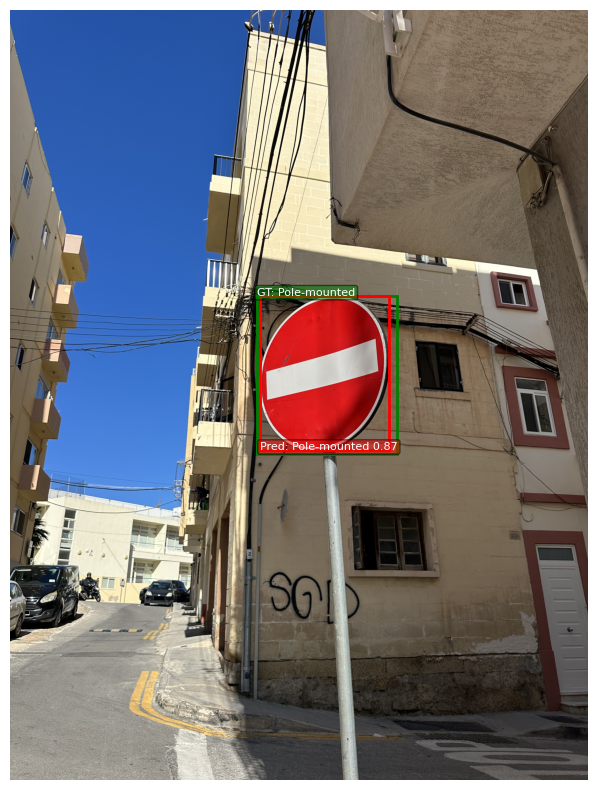

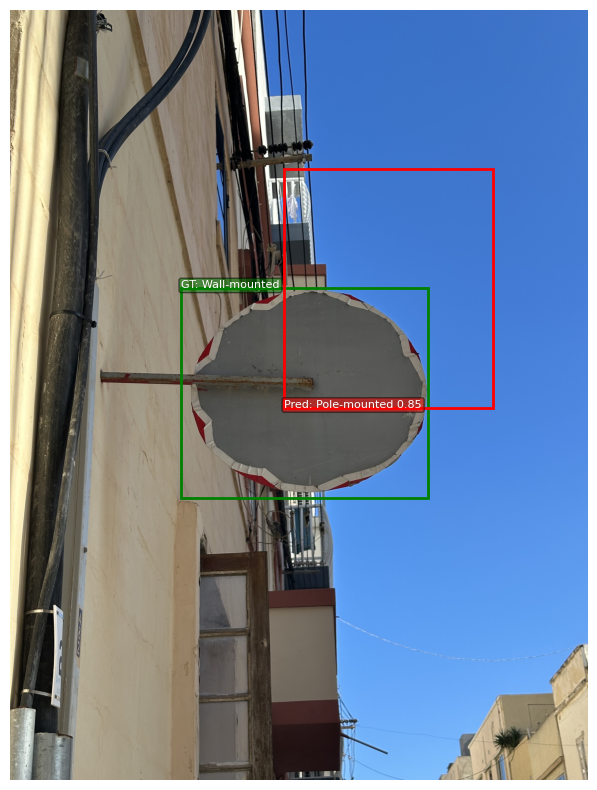

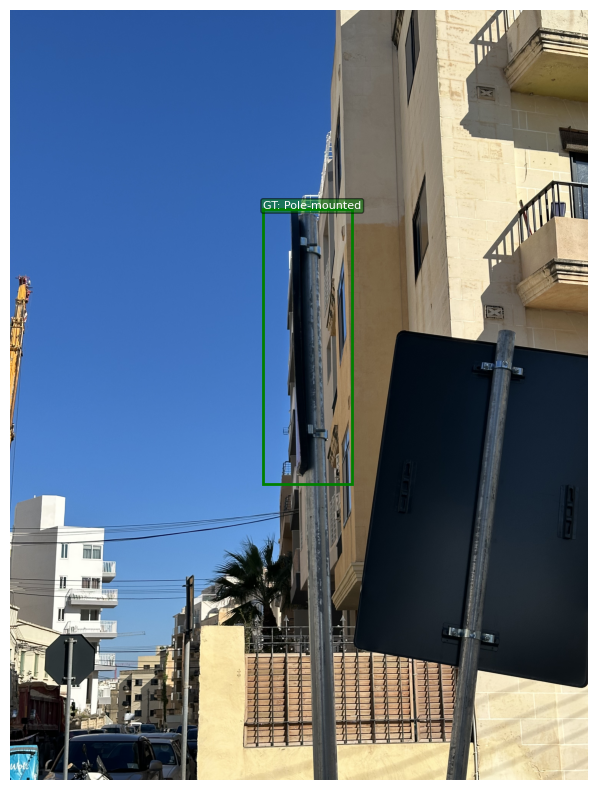

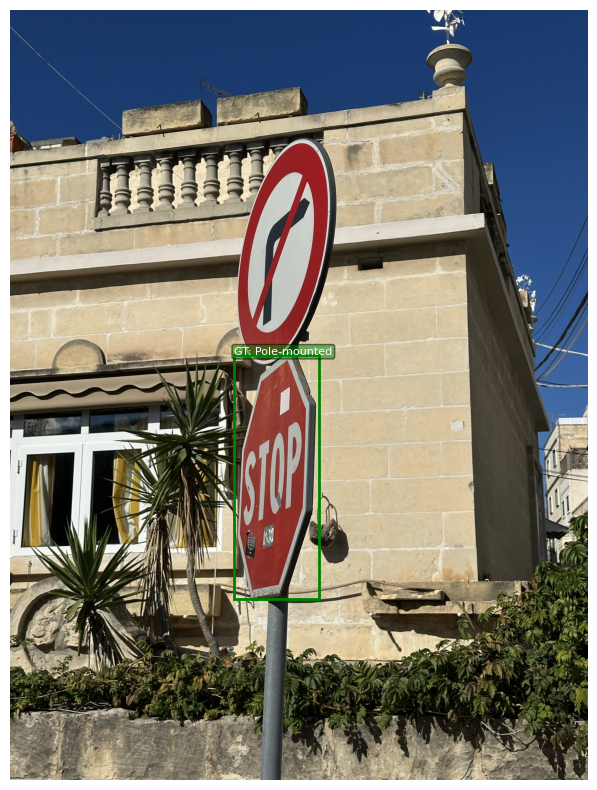

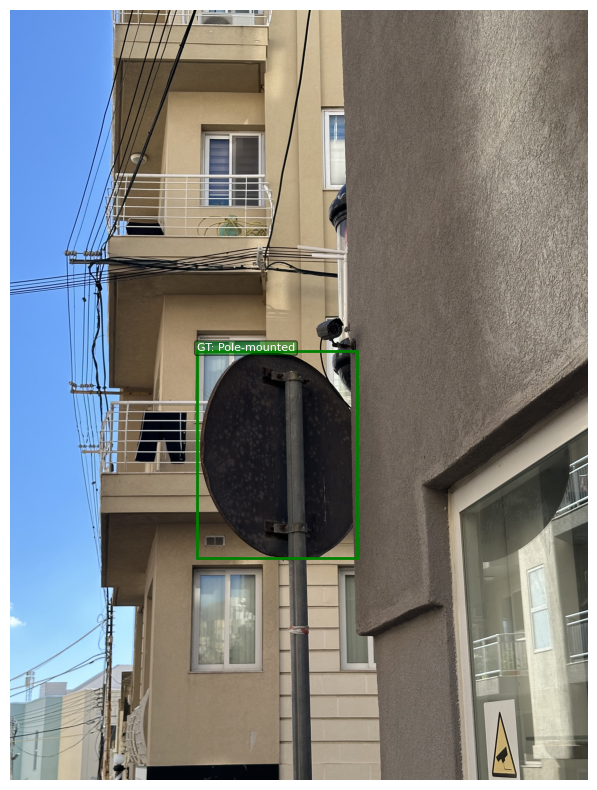

...

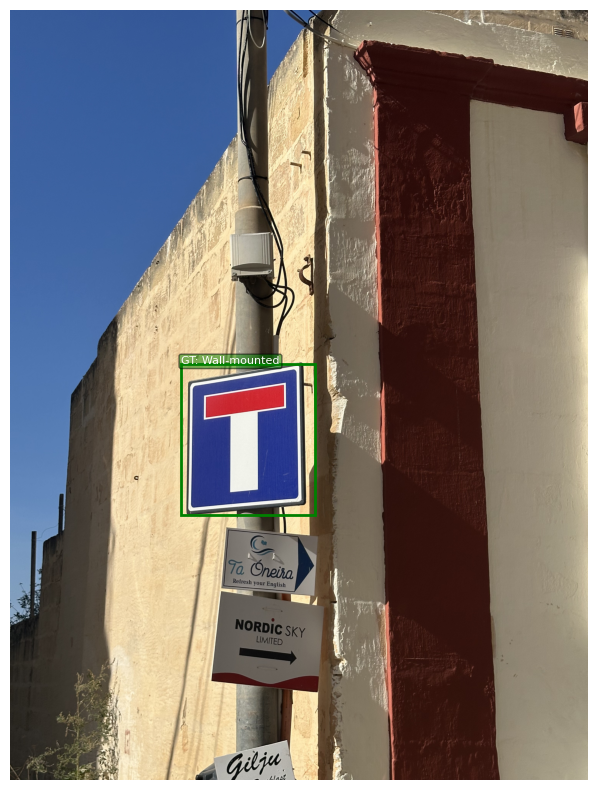

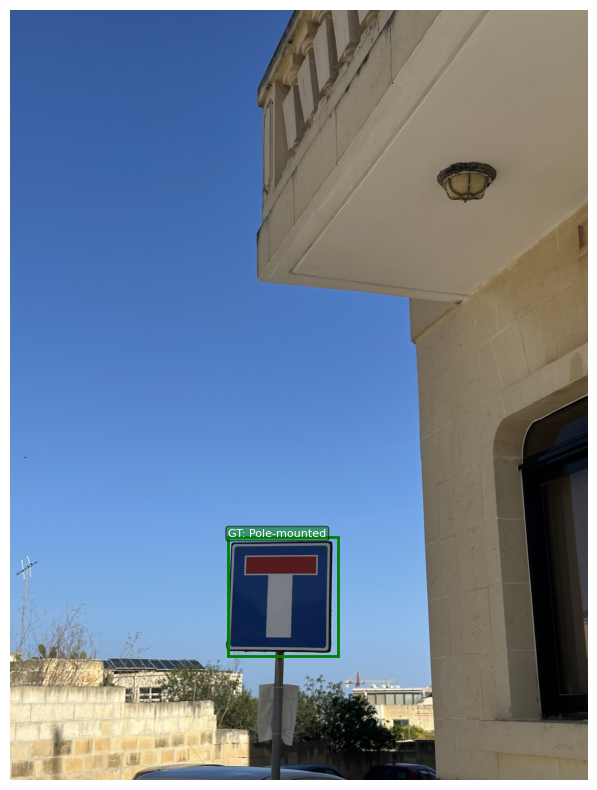

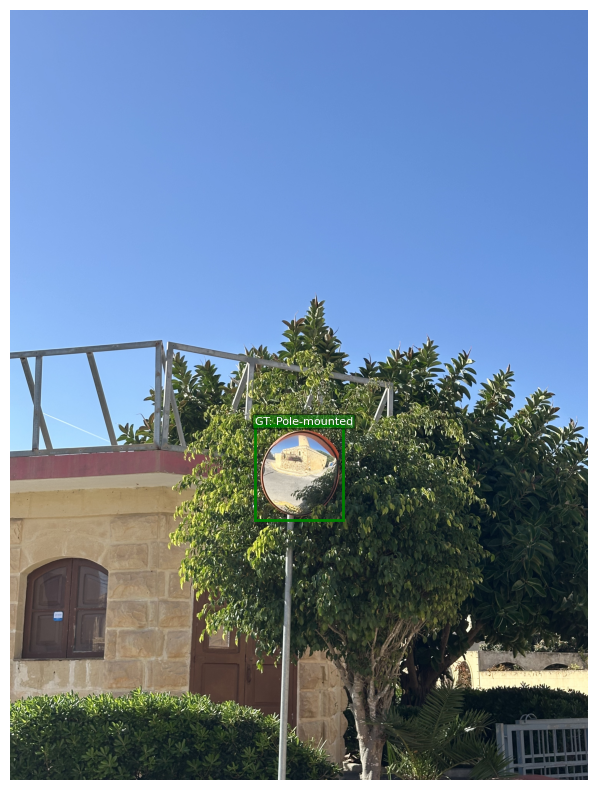

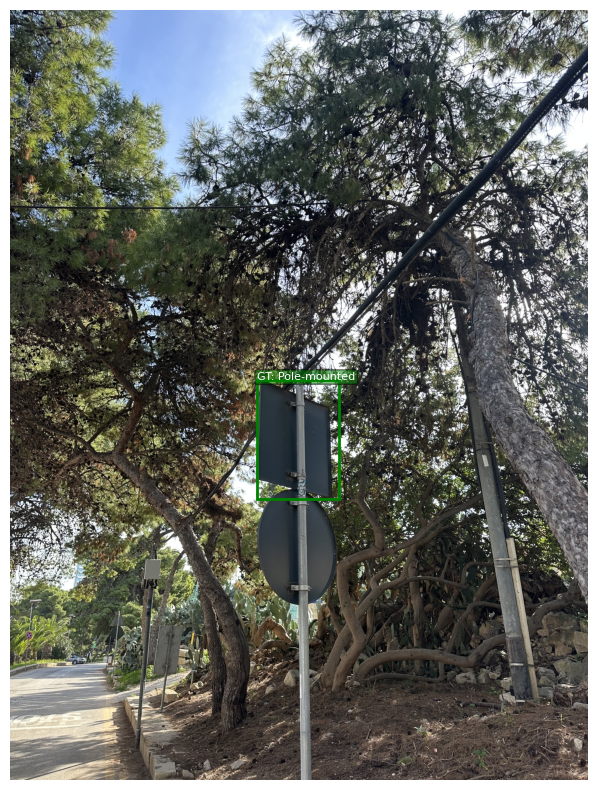

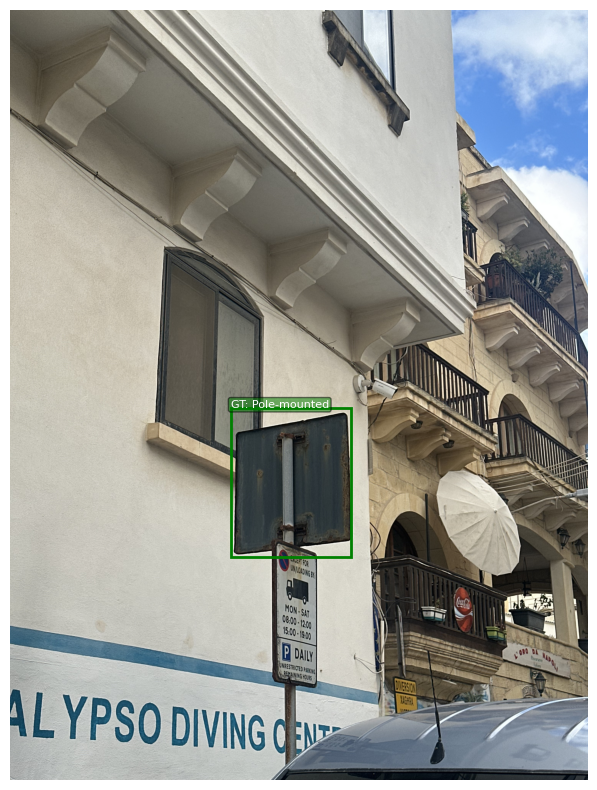

In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import ImageOps

for i in range(20):
    path, image, annotations = ds[i]
    image = Image.open(path)
    detections = rf_detr_model.predict(image)

    image = ImageOps.exif_transpose(image)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    for annotation_xyxy, annotation_class_id in zip(annotations.xyxy, annotations.class_id):
        rect = patches.Rectangle(
            (annotation_xyxy [0], annotation_xyxy [1]),
            annotation_xyxy [2] - annotation_xyxy [0],
            annotation_xyxy [3] - annotation_xyxy [1],
            linewidth = 2,
            edgecolor = "g",
            facecolor = "none",
            label = "Ground Truth"
        )
        ax.add_patch(rect)
        ax.text(
            annotation_xyxy [0], annotation_xyxy [1], 
            f"GT: {ds.classes [annotation_class_id]}", 
            color = "white", 
            backgroundcolor = "green", 
            fontsize = 8,
            bbox = dict(boxstyle = "round,pad=0.2", facecolor = "green", alpha = 0.5)
        )

    for detection_xyxy, confidence, class_id in zip(detections.xyxy, detections.confidence, detections.class_id):
        rect = patches.Rectangle(
            (detection_xyxy [0], detection_xyxy [1]),
            detection_xyxy [2] - detection_xyxy [0],
            detection_xyxy [3] - detection_xyxy [1],
            linewidth = 2,
            edgecolor = "r",
            facecolor = "none",
            label = "Prediction"
        )
        ax.add_patch(rect)
        ax.text(
            detection_xyxy [0], detection_xyxy [3], 
            f"Pred: {ds.classes [class_id]} {confidence:0.2f}", 
            color = "white", 
            backgroundcolor = "red", 
            fontsize = 8,
            bbox = dict(boxstyle = "round,pad=0.2", facecolor = "red", alpha = 0.5)
        )

    ax.imshow(image)
    ax.axis("off")
    plt.tight_layout()
    plt.show()